In this notebook, we will try the process of implementing CNN with Keras in order to classify images.

I.   **Firstly**, we'll import useful packages.

II.   **Then**, we'll load the data, before visualize and preprocess it.

III.  **We'll try a simple CNN model** and then we will evaluate its performances.

IV.   **Finally,** we'll use techniques such as data augmentation, learning rate decay and dropout to increase our test F1.

# I. Let import all useful packages.

In [1]:
!pip install tensorflow-addons

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 1.1 MB 10.5 MB/s 


In [2]:

from tensorflow import keras
import tensorflow.keras.layers as Layers
from tensorflow.keras.layers import Activation, BatchNormalization, Conv2D, Dense, Dropout, Flatten, MaxPooling2D
import tensorflow.keras.activations as Actications
import tensorflow.keras.models as  Sequential
import tensorflow.keras.optimizers as Optimizer
import tensorflow.keras.metrics as Metrics
import tensorflow.keras.utils as Utils
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import ModelCheckpoint, TensorBoard, ReduceLROnPlateau
import tensorflow_addons as tfa
import os
import random
import datetime
import cv2
import numpy as np
import seaborn as sns
import glob

import matplotlib.pyplot as plt
%matplotlib inline

os.environ["TF_CPP_MIN_LOG_LEVEL"] = "2"
import warnings
warnings.filterwarnings('ignore')
import tensorflow as tf

from tensorflow.keras.losses import CategoricalCrossentropy

from sklearn.metrics import confusion_matrix, classification_report

from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.regularizers import l2

**Task 1:** Setting Fre GPU in this Google Colab notebook.

[*Hint.*](https://medium.com/deep-learning-turkey/google-colab-free-gpu-tutorial-e113627b9f5d)

In [3]:

tf.test.gpu_device_name()

'/device:GPU:0'

In [4]:
from tensorflow.python.client import device_lib
device_lib.list_local_devices()

[name: "/device:CPU:0"
 device_type: "CPU"
 memory_limit: 268435456
 locality {
 }
 incarnation: 7042569255998702902
 xla_global_id: -1, name: "/device:GPU:0"
 device_type: "GPU"
 memory_limit: 14465892352
 locality {
   bus_id: 1
   links {
   }
 }
 incarnation: 17853909736073346389
 physical_device_desc: "device: 0, name: Tesla T4, pci bus id: 0000:00:04.0, compute capability: 7.5"
 xla_global_id: 416903419]

## Mounting Google Drive locally
**Task 2:** Mount the Google Driver into the Google Colab Driver.

[*Hint.*](https://colab.research.google.com/notebooks/io.ipynb#scrollTo=eikfzi8ZT_rW)

In [5]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


**Task 3**: Copy the zip dataset from Google Drive into Colab, then unzip it and finally remove the zip file to free up space.

[*Hint.*](https://medium.com/datadriveninvestor/speed-up-your-image-training-on-google-colab-dc95ea1491cf)

In [ ]:
!cd 'drive/MyDrive' && unzip data -d './1_unzip'

Streaming output truncated to the last 5000 lines.
  inflating: ./1_unzip/seg_train/seg_train/mountain/7506.jpg  
  inflating: ./1_unzip/seg_train/seg_train/mountain/7537.jpg  
  inflating: ./1_unzip/seg_train/seg_train/mountain/7539.jpg  
  inflating: ./1_unzip/seg_train/seg_train/mountain/7551.jpg  
  inflating: ./1_unzip/seg_train/seg_train/mountain/7560.jpg  
  inflating: ./1_unzip/seg_train/seg_train/mountain/7565.jpg  
  inflating: ./1_unzip/seg_train/seg_train/mountain/7578.jpg  
  inflating: ./1_unzip/seg_train/seg_train/mountain/7581.jpg  
  inflating: ./1_unzip/seg_train/seg_train/mountain/7586.jpg  
  inflating: ./1_unzip/seg_train/seg_train/mountain/7647.jpg  
  inflating: ./1_unzip/seg_train/seg_train/mountain/7652.jpg  
  inflating: ./1_unzip/seg_train/seg_train/mountain/7654.jpg  
  inflating: ./1_unzip/seg_train/seg_train/mountain/7662.jpg  
  inflating: ./1_unzip/seg_train/seg_train/mountain/767.jpg  
  inflating: ./1_unzip/seg_train/seg_train/mountain/7672.jpg  
  inf

# II. Load the data.

## About dataset.
This is image data of Natural Scenes around the world.
This Data contains around 25k images of size 150x150 distributed under 6 categories. {'buildings' -> 0, 'forest' -> 1, 'glacier' -> 2, 'mountain' -> 3, 'sea' -> 4, 'street' -> 5 }

The Train, Test and Prediction data is separated in each zip files. There are around 14k images in Train, 3k in Test.


Now, We need to prepare our data to feed into the model. There is a builtin method in Keras that can extract your images from folder.

Following is the gernalized functions used to extract data from the directory.

In [ ]:
# Here's our 6 categories that we have to classify.
class_names = ['buildings', 'forest', 'glacier', 'mountain', 'sea', 'street']
class_names_label = {'buildings': 0,
                    'forest' : 1,
                    'glacier' : 2,
                    'mountain' : 3,
                    'sea' : 4,
                    'street' : 5
                    }
nb_classes = 6

## Loading the Data

**Task 4:** We have to write a load_data function that load the training and test data ( which contain images and the labels) from the folder.

* **Load_data** function return **train_set** and **test_set**. Each set contains **images and labels**.
* Apply 2 augmentation transformations (**shear_range** = 0.2, **zoom_range** = 0.2), shuffle with seed = 8 and rescaling function( to [0, 1]) to **train_set.**
* Apply rescaling funtion to [0, 1]  to **test_set**, no shuffle.
* Batch size = 32.



[*Hint.*](https://keras.io/preprocessing/image/)


In [ ]:

def load_data(data_directories):
    """
        Load the data:
            - 14,034 images to train the network.
            - 3000 images to evaluate how accurately the network learned to classify images.
        Input:
            Data directory.
        Return: 
            training_set, testing_set.
    """
    ## TYPE YOUR CODE for task 4 here:
    train_gen = ImageDataGenerator(rescale=1.0/255,
                                   shear_range=0.2,
                                   zoom_range=0.2)
    train_genset = train_gen.flow_from_directory(data_directories[0],
                                                 target_size=(150,150),
                                                 batch_size=32,
                                                 shuffle=True,
                                                 seed=8,
                                                 class_mode='categorical')
    test_gen = ImageDataGenerator(rescale=1.0/255,
                                   shear_range=0.2,
                                   zoom_range=0.2)
    test_genset = train_gen.flow_from_directory(data_directories[1],
                                                 target_size=(150,150),
                                                 batch_size=32,
                                                 shuffle=True,
                                                 seed=8,
                                                 class_mode='categorical')
    return train_genset, test_genset



In [ ]:
data_directories = ['drive/MyDrive/1_unzip/seg_train/seg_train/', 'drive/MyDrive/1_unzip/seg_test/seg_test/']
train_dataset, test_dataset = load_data(data_directories)

Found 14034 images belonging to 6 classes.
Found 3000 images belonging to 6 classes.


In [ ]:
train_dataset.class_indices.items()

dict_items([('buildings', 0), ('forest', 1), ('glacier', 2), ('mountain', 3), ('sea', 4), ('street', 5)])

## Let's explore the dataset.
We can, for example, ask ourselves:

* How many training and testing examples do we have ?
* What is the size of the images ?
* What is the proportion of each observed category ?

As you see, The Training data is in shape of (Number of Training Images, Width of image, Height of image, Channel of image). This shape is very important. If you didnot resize the images to same size. It should be (No. of images,) shape. So, using this shape you cant feed the images to the model.


**Task 5:** Print out:

*  Number of training examples.
*  Number of testing examples.
* Size of each image.



In [ ]:
## TYPE YOUR CODE for task 5 here:
shape_image = train_dataset.image_shape
shape_image

(150, 150, 3)

In [ ]:
train_dataset.target_size

(150, 150)

**Task 6:** Plot a pie chart of the proportion of each class.
You need to show the name and proportion of each class on the pie chart.

*Hint:* [plot.pie](https://matplotlib.org/3.1.1/gallery/pie_and_polar_charts/pie_features.html#sphx-glr-gallery-pie-and-polar-charts-pie-features-py)

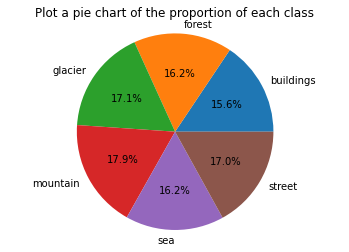

In [ ]:
def plot_pie(train_dataset, class_names):
    ## TYPE YOUR CODE for task 6 here:
    num_buldings=round(int(len(list(glob.iglob("drive/MyDrive/1_unzip/seg_train/seg_train/buildings/*.jpg"))))*100/14034,2)
    num_forest = round(int(len(list(glob.iglob("drive/MyDrive/1_unzip/seg_train/seg_train/forest/*.jpg"))))*100/14034,2)
    num_glacier = round(int(len(list(glob.iglob("drive/MyDrive/1_unzip/seg_train/seg_train/glacier/*.jpg"))))*100/14034,2)
    num_mountain = round(int(len(list(glob.iglob("drive/MyDrive/1_unzip/seg_train/seg_train/mountain/*.jpg"))))*100/14034,2)
    num_sea = round(int(len(list(glob.iglob("drive/MyDrive/1_unzip/seg_train/seg_train/sea/*.jpg"))))*100/14034,2)
    num_street = round(int(len(list(glob.iglob("drive/MyDrive/1_unzip/seg_train/seg_train/street/*.jpg"))))*100/14034,2)

    data = [num_buldings, num_forest, num_glacier, num_mountain, num_sea, num_street]
    plt.pie(data,labels=class_names,autopct='%1.1f%%')
    plt.title('Plot a pie chart of the proportion of each class')
    plt.axis('equal')
    plt.show()
    plt.show()

plot_pie(train_dataset, class_names)


**Task 7**: Display the 36 random images from the training set.

* Each class contain 6 random images.
* Bellow the image, show the class it belongs to.

*Hint*: [plot.imshow](https://matplotlib.org/3.1.0/gallery/images_contours_and_fields/image_demo.html)

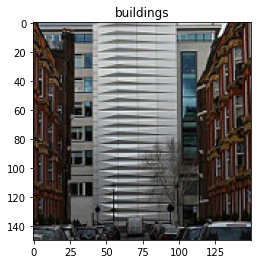

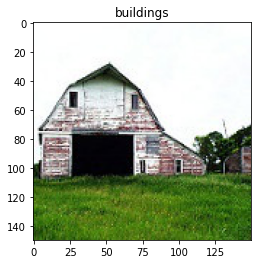

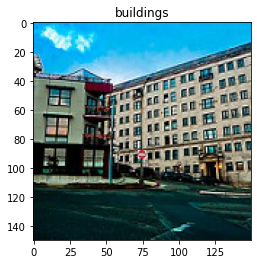

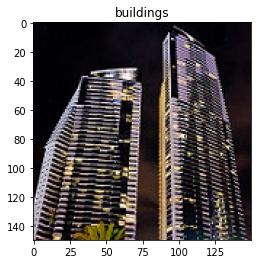

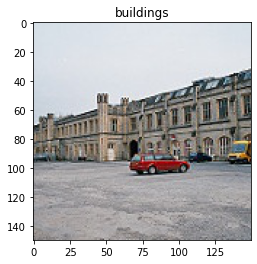

...

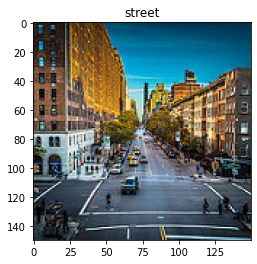

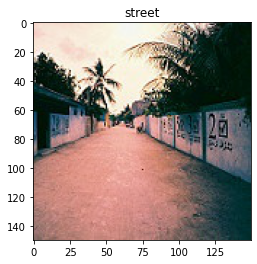

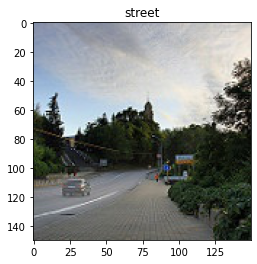

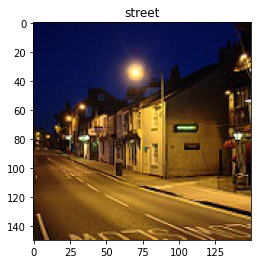

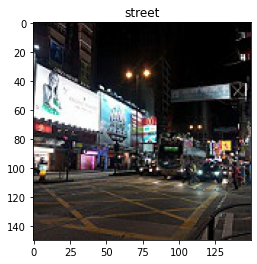

In [ ]:
import matplotlib.image as mpimg
for c in ['buildings', 'forest', 'glacier', 'mountain', 'sea', 'street']:
    a = os.listdir("/content/drive/MyDrive/1_unzip/seg_train/seg_train/"+c)
    for i in range(6):
        image = mpimg.imread('/content/drive/MyDrive/1_unzip/seg_train/seg_train/'+c+'/'+a[i])
        plt.imshow(image)
        plt.title(c)
        plt.show()

# III. Modelling
## There are some steps we need to finish:
* Build the model.

* Compile the model.

* Train / fit the data to the model.

* Evaluate the model on the testing set.


## Build the model
We can build an easy model composed of different layers such as:

* [Conv2D](https://www.tensorflow.org/api_docs/python/tf/keras/layers/Conv2D).

* [MaxPooling2D:](https://www.tensorflow.org/api_docs/python/tf/keras/layers/MaxPool2D) The images get smaller sized.

* [Flatten:](https://www.tensorflow.org/api_docs/python/tf/keras/layers/Flatten) Transforms the format of the images from a 2d-array to a 1d-array of 150 150 3 pixel values.

* [Relu:](https://www.tensorflow.org/api_docs/python/tf/keras/layers/ReLU) given a value x, returns max(x, 0).

* [Softmax:](https://www.tensorflow.org/api_docs/python/tf/keras/layers/Softmax) 6 neurons, probability that the image belongs to one of the classes.

* [Dense.](https://www.tensorflow.org/api_docs/python/tf/keras/layers/Dense)

* [Dropout.](https://www.tensorflow.org/api_docs/python/tf/keras/layers/Dropout)

**Task 8**: Buil a model, which contain these layers:
- Layer 1: Conv2D, 8 filters, kernel_size = (3, 3), activation = 'relu', input_shape = image_shape, same padding.
- Layer 2: Conv2D, 16 filters, kernel_size = (3, 3), activation = 'relu', same padding.
- Layer 3: MaxPooling2D, pooling size = (2, 2).
- Layer 4: Conv2D, 32 filters, kernel_size = (3, 3), activation = 'relu', same padding.
- Layer 5: Conv2D, 64 filters, kernel_size = (3, 3), activation = 'relu', same padding.
- Layer 6: MaxPooling2D, pooling size = (3, 3).
- Layer 7: Conv2D, 128 filters, kernel_size = (3, 3), activation = 'relu', same padding.
- Layer 8: Conv2D, 256 filters, kernel_size = (3, 3), activation = 'relu', same padding.
- Layer 9: MaxPooling2D, pooling size = (5, 5).
- Layer 10: Flatten.
- Layer 11: Dense with number of unit = 100, activation = 'relu'.
- Layer 12: Dropout with probs = 0.5.
- Layer 13: Final dense with number of unit = number of class, activation = 'softmax'.



All the Conv2D and Dense layers are followed by a Batch Norm layer with customized configuration excepts from the last dense layer:

- momentum=0.95 
- epsilon=0.005
- beta_initializer = RandomNormal with mean = 0 and stddev = 0.05
- gammaa_initializer = Constant with value = 0.9


In [ ]:
from tensorflow.keras.initializers import RandomNormal, Constant
from tensorflow.keras import models

In [ ]:
def create_model():
    model = models.Sequential([
                        Conv2D(8,(3,3),activation='relu', input_shape =shape_image,padding='same'),
                        BatchNormalization(momentum=0.95, epsilon=0.005, beta_initializer=RandomNormal(mean=0.0, stddev=0.05), gamma_initializer=Constant(value=0.9)),
                        Conv2D(16,kernel_size = (3,3),activation='relu',padding='same'),
                        BatchNormalization(momentum=0.95, epsilon=0.005, beta_initializer=RandomNormal(mean=0.0, stddev=0.05), gamma_initializer=Constant(value=0.9)),
                        MaxPooling2D(pool_size=(2, 2)),
                        Conv2D(32,kernel_size = (3,3),activation='relu',padding='same'),
                        BatchNormalization(momentum=0.95, epsilon=0.005, beta_initializer=RandomNormal(mean=0.0, stddev=0.05), gamma_initializer=Constant(value=0.9)),
                        Conv2D(64,kernel_size = (3,3),activation='relu',padding='same'),
                        BatchNormalization(momentum=0.95, epsilon=0.005, beta_initializer=RandomNormal(mean=0.0, stddev=0.05), gamma_initializer=Constant(value=0.9)),
                        MaxPooling2D(pool_size=(3, 3)),
                        Conv2D(128,kernel_size = (3,3),activation='relu',padding='same'),
                        BatchNormalization(momentum=0.95, epsilon=0.005, beta_initializer=RandomNormal(mean=0.0, stddev=0.05), gamma_initializer=Constant(value=0.9)),
                        Conv2D(256,kernel_size = (3,3),activation='relu',padding='same'),
                        BatchNormalization(momentum=0.95, epsilon=0.005, beta_initializer=RandomNormal(mean=0.0, stddev=0.05), gamma_initializer=Constant(value=0.9)),
                        MaxPooling2D(pool_size=(5, 5)),
                        Flatten(),
                        Dense(units=100, activation='relu'),
                        BatchNormalization(momentum=0.95, epsilon=0.005, beta_initializer=RandomNormal(mean=0.0, stddev=0.05), gamma_initializer=Constant(value=0.9)),
                        Dropout(0.5),
                        Dense(units=6, activation='softmax')
                        ])
    return model

In [ ]:
cnn_model =create_model()

**Task 9:** Compile the model. Then print out the model summary.
* [Compile](https://keras.io/models/model/#compile) the model with Adam Optimizaer, lr = 1e-4, categorical-crossentroy loss and "[F1 score](https://github.com/tensorflow/addons/issues/825)" as metric.
* Print out the model F1.

In [ ]:

from sklearn.metrics import f1_score

In [ ]:
cnn_model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 150, 150, 8)       224       
                                                                 
 batch_normalization (BatchN  (None, 150, 150, 8)      32        
 ormalization)                                                   
                                                                 
 conv2d_1 (Conv2D)           (None, 150, 150, 16)      1168      
                                                                 
 batch_normalization_1 (Batc  (None, 150, 150, 16)     64        
 hNormalization)                                                 
                                                                 
 max_pooling2d (MaxPooling2D  (None, 75, 75, 16)       0         
 )                                                               
                                                        

In [ ]:
optimizer = Adam(learning_rate=1e-4)

In [ ]:
cnn_model.compile(optimizer = optimizer, loss = 'categorical_crossentropy', metrics=['accuracy'])
optimizer = Adam(learning_rate=1e-4)

**Task 10**: Setup callback.
* Create the [tensorboard callback](https://www.tensorflow.org/tensorboard/tensorboard_in_notebooks) to save the logs.
* Create the [checkpoint callback](https://machinelearningmastery.com/check-point-deep-learning-models-keras/) to save the checkpoint with the best F1 after each epoch. 
* Create the [ReduceLROnPlateau callback](https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/ReduceLROnPlateau) to reduce learning rate when the validation F1 score has stopped improving with the factor of 0.1 and patience = 2.

In [ ]:
def callback_model(checkpoint_name, logs_name):
    '''
    Input: 
        Best checkpoint name, logs name.
    Return: 
        Callback list, which contains tensorboard callback and checkpoint callback.
    '''
    logs = os.path.join('/content/drive/MyDrive/1_unzip',logs_name)
    tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=logs, histogram_freq=1)

    '''log = os.path.join(logs_name, datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
    tensorboard_callback = tf.keras.callbacks.TensorBoard(log, histogram_freq=1)'''

    filepath= os.path.join('/content/drive/MyDrive/1_unzip',checkpoint_name)
    checkpoint = ModelCheckpoint(filepath, monitor='val_accuracy', verbose=1, save_best_only=True, mode='max')
    

    reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.1,
                              patience=2)
    
    callbacks_list = [tensorboard_callback,checkpoint,reduce_lr]

    ## TYPE YOUR CODE for task 10 here:
    
    return callbacks_list


In [ ]:

checkpoint_name = 'weights.best.hdf5'
logs_name = 'training_logs'
callbacks_list = callback_model(checkpoint_name, logs_name)

In [ ]:
!pip install tensorboardcolab

  Created wheel for tensorboardcolab: filename=tensorboardcolab-0.0.22-py3-none-any.whl size=3859 sha256=68827fbb57f1fe1a0f1e08c227d187085ca0b610e95e008f41ab2d4b280a36a1
  Stored in directory: /root/.cache/pip/wheels/69/4e/4a/1c6c267395cb10edded1050df12af165d3254cfce324e80941
Successfully built tensorboardcolab


In [ ]:
from tensorboardcolab import TensorBoardColab, TensorBoardColabCallback


**Task 11:** Train the model.

**Requirement:** 
* Train the model with 10 epochs, generator = train_dataset, validataion_data = test_dataset.
* Return the model with best-checkpoint weights.

*Hint:*
[Fit](https://keras.io/models/sequential/#fit_generator) the model first, then reload the model ([load_model function](https://keras.io/getting-started/faq/)) with best-checkpoint weights.

In [ ]:
def train_model(model, callbacks_list):
    '''
    Input: 
        Model and callback list,
    Return: 
        Model with best-checkpoint weights.
    '''
    ## TYPE YOUR CODE for task 11 here:
    history = model.fit(train_dataset,epochs=10, validation_data=test_dataset, callbacks=callbacks_list,verbose=1)
    return history


In [ ]:
train_model = train_model(cnn_model, callbacks_list)

KeyboardInterrupt: ignored

In [ ]:
rm -rf ./logs/

**Task 12**: [Show the tensorboard](https://www.tensorflow.org/tensorboard/tensorboard_in_notebooks) in the notebook.

In [ ]:
# Load the TensorBoard notebook extension
import datetime
from tensorboard import notebook


In [ ]:
%load_ext tensorboard

In [ ]:

logdir ='/content/drive/MyDrive/1_unzip/training_logs/content/drive/MyDrive/1_unzip/training_logs'
%tensorboard --logdir logdir

<IPython.core.display.Javascript object>

**Task 13:** Prediction on test set.
* Complete the get_prediction_classes function.
* Print out the test F1. 

In [ ]:
test_dataset = '/content/drive/MyDrive/1_unzip/seg_test/seg_test'

In [ ]:
test_datagen = ImageDataGenerator(rescale=1.0/255)

test_generator = test_datagen.flow_from_directory(test_dataset,
                                                 shuffle=False,
                                                 batch_size=32,
                                                 target_size = (150, 150),
                                                 class_mode='categorical')

Found 3000 images belonging to 6 classes.


In [ ]:
test_loss, test_accuracy = cnn_model.evaluate(test_generator, batch_size=32)

94/94 [==============================] - 13s 138ms/step - loss: 0.9376 - accuracy: 0.6460


In [ ]:
def get_prediction_classes(model, prediction_dataset):
    ## TYPE YOUR CODE for task 13 here:
    '''
    Input: 
        Model and prediction dataset.
    Return: 
        Prediction list and groundtrurth list with predicted classes.
    '''
    predictions = model.predict(prediction_dataset)
    y_pred = np.argmax(predictions, axis=1)
    y_true = test_generator.classes
    return y_pred, y_true

In [ ]:
y_p,y_t = get_prediction_classes(cnn_model, test_generator)

**Task 14:** Perform the predicted result on test set using confusion matrix.
Remember to show the class name in the confusion matrix. 

In [ ]:
from sklearn.metrics import plot_confusion_matrix

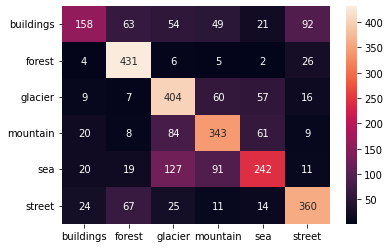

In [ ]:
import seaborn as sns
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(y_t, y_p)
f = sns.heatmap(cm, annot=True, fmt='d',xticklabels=class_names, 
           yticklabels=class_names)

**Task 15**: Model finetuning - fine tune the model using some of these approachs:
* Increase max epochs, change batch size.
* Play around with CNN, Dense and Dropoutlayers (add/# units/etc).
* Increase data augmentation transformations.
* Try to use a [pretrained model](https://www.tensorflow.org/api_docs/python/tf/keras/applications) on Keras.

Requirement: The val_best_F1 should be higher than 87%.

In [ ]:
# tăng epochs = 50, đổi batch size = 64
train_gen1 = ImageDataGenerator(rescale=1.0/255,
                                shear_range=0.2,
                                zoom_range=0.2)
train_genset1 = train_gen1.flow_from_directory(data_directories[0],
                                                target_size=(150,150),
                                                batch_size=64,
                                                shuffle=True,
                                                seed=8,
                                                class_mode='categorical')
test_gen1 = ImageDataGenerator(rescale=1.0/255,
                                shear_range=0.2,
                                zoom_range=0.2)
test_genset1 = train_gen1.flow_from_directory(data_directories[1],
                                                target_size=(150,150),
                                                batch_size=64,
                                                shuffle=True,
                                                seed=8,
                                                class_mode='categorical')

train_model_1 = cnn_model.fit(train_genset1,epochs=50, validation_data=test_genset1, callbacks=callbacks_list,verbose=1)
train_model_1

KeyboardInterrupt: ignored

In [ ]:
def create_model_2():
    model_2 = models.Sequential([
        Conv2D(filters=128, kernel_size=(5, 5), padding='valid', input_shape=shape_image),
        Activation('relu'),
        MaxPooling2D(pool_size=(2, 2)),
        BatchNormalization(),
        
        Conv2D(filters=64, kernel_size=(3, 3), padding='valid', kernel_regularizer=l2(0.00005)),
        Activation('relu'),
        MaxPooling2D(pool_size=(2, 2)),
        BatchNormalization(),
        
        Conv2D(filters=32, kernel_size=(3, 3), padding='valid', kernel_regularizer=l2(0.00005)),
        Activation('relu'),
        MaxPooling2D(pool_size=(2, 2)),
        BatchNormalization(),
        
        Flatten(),
        
        Dense(units=256, activation='relu'),
        Dropout(0.5),
        Dense(units=6, activation='softmax')
    ])
    
    return model_2

In [ ]:
cnn_model_2 = create_model_2()

In [ ]:
optimizer_2 = Adam(learning_rate=1e-4)

In [ ]:
cnn_model_2.compile(optimizer = optimizer_2, loss = 'categorical_crossentropy', metrics=['accuracy'])

In [ ]:
def train_model_2(model, callbacks_list):
    '''
    Input: 
        Model and callback list,
    Return: 
        Model with best-checkpoint weights.
    '''
    ## TYPE YOUR CODE for task 11 here:
    history = model.fit(train_dataset,epochs=10, validation_data=test_dataset, callbacks=callbacks_list,verbose=1)
    return history

In [ ]:
model_2 = train_model_2(cnn_model_2, callbacks_list)

Epoch 1/10
 11/439 [..............................] - ETA: 49:00 - loss: 2.3621 - accuracy: 0.3381